In [1]:
import os
import cv2
from sahi.predict import get_sliced_prediction
from sahi.models.yolov8 import Yolov8DetectionModel
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json


def draw_boxes_on_frame(frame, boxes, class_ids, colors, output_dir, frame_index):
    fig, ax = plt.subplots(figsize=(64, 36))  # Adjust for 4K resolution
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    for box, cls_id in zip(boxes, class_ids):
        x1, y1, x2, y2 = box
        color = colors[cls_id % len(colors)]  # Select color based on class ID
        direction = directions[cls_id % len(directions)]
        #rect = patches.Circle((x1 + (x2 - x1) / 2, y1 + (y2 - y1) / 2), radius=5, linewidth=8, edgecolor=color, facecolor='none')
        #ax.add_patch(rect)
        ax.arrow(x1 + (x2 - x1) / 2, y1 + (y2 - y1) / 2, direction[0], direction[1], head_width=10, head_length=10, fc=color, ec=color, linewidth=3)
    ax.axis('off')
    plt.tight_layout()
    formatted_frame_index = str(frame_index).zfill(4)
    plt.savefig(os.path.join(output_dir, f'plot_{formatted_frame_index}.jpg'), dpi=75)
    plt.close()


def detect_and_draw_boxes_sliced(image_path, model_path, slice_height, slice_width, overlap_height_ratio, overlap_width_ratio, output_dir, frame_index):
    # Load your detection model as YOLOv8
    detection_model = Yolov8DetectionModel(
        model_path=model_path,
        confidence_threshold=0.3,
        device="cuda:0"  # or "cpu"
    )

    # Perform sliced detection
    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=slice_height,
        slice_width=slice_width,
        overlap_height_ratio=overlap_height_ratio,
        overlap_width_ratio=overlap_width_ratio
    )
   # Convert results to a JSON-friendly format
    json_results = []
    for object_prediction in result.object_prediction_list:
        # Convert each coordinate to standard Python float
        bbox = [float(coord) for coord in object_prediction.bbox.to_voc_bbox()]
        class_id = int(object_prediction.category.id)  # Convert to int if necessary
        json_results.append({
            "bbox": bbox,
            "class_id": class_id
        })

    # Save the results to a JSON file
    with open(os.path.join(output_dir, f'predictions_{frame_index}.json'), 'w') as f:
        json.dump(json_results, f, indent=4)

     # Read the original image
    original_image = cv2.imread(image_path)

    # Extract boxes and class IDs from result
    boxes = []
    class_ids = []
    for object_prediction in result.object_prediction_list:
        bbox = object_prediction.bbox.to_voc_bbox()  # Convert to VOC format
        class_id = object_prediction.category.id  # Use the 'id' attribute from Category
        boxes.append(bbox)
        class_ids.append(class_id)

    # Call the custom draw function with class IDs
    draw_boxes_on_frame(original_image, boxes, class_ids, colors, output_dir, frame_index)



# Colors and Directions for different classes
colors = [
    (1.0, 0.0, 0.0),       # East - Red
    (0.31, 1.0, 0.0),      # North - Bright Green
    (1.0, 0.84, 0.0),      # Northeast - Gold
    (0.0, 1.0, 0.529),     # Northwest - Turquoise
    (0.996, 0.0, 0.937),   # South - Pink
    (1.0, 0.0, 0.09),      # Southeast - Scarlet
    (0.216, 0.0, 1.0),     # Southwest - Electric Blue
    (0.0, 0.624, 1.0)      # West - Sky Blue
]
directions = [
    (28.3,0),   #'East
    (0,-28.3),  #'North'
    (20,-20),   #'Northeast'
    (-20,-20),  #'Northwest'
    (0,28.3),   #'South'
    (20,20),    #'Southeast'
    (20,-20),   #'Southwest'
    (-20,0)     #'West'
    ]

# Your model path and image path
model_path = '/Users/apaula/Downloads/fishschool_0102.pt'
image_path = '/Users/apaula/Downloads/testframe.jpg'
output_dir = "output/"
frame_index = 1  # Example index, adjust as needed

# Call the function with the necessary parameters
detect_and_draw_boxes_sliced(image_path, model_path, 640, 640, 0.2, 0.2, output_dir, frame_index)


TypeError: ('model_path is not a valid yolov8 model path: ', FileNotFoundError(2, 'No such file or directory'))

In [5]:
print("Attributes of PredictionResult object:", dir(result))

NameError: name 'result' is not defined

In [6]:
result=model('/Users/apaula/Downloads/testframe.jpg')


image 1/1 /Users/apaula/Downloads/testframe.jpg: 384x640 153 easts, 15 wests, 116.8ms
Speed: 1.9ms preprocess, 116.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


In [9]:
result[0]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'east', 1: 'north', 2: 'northeast', 3: 'northwest', 4: 'south', 5: 'southeast', 6: 'southwest', 7: 'west'}
orig_img: array([[[ 99, 121,  96],
        [ 99, 121,  96],
        [ 99, 121,  96],
        ...,
        [149, 175, 145],
        [148, 174, 144],
        [148, 174, 144]],

       [[ 96, 118,  93],
        [ 96, 118,  93],
        [ 96, 118,  93],
        ...,
        [148, 174, 144],
        [147, 173, 143],
        [147, 173, 143]],

       [[ 92, 114,  89],
        [ 92, 114,  89],
        [ 92, 114,  89],
        ...,
        [147, 173, 143],
        [146, 172, 142],
        [145, 171, 141]],

       ...,

       [[112, 130,  93],
        [112, 130,  93],
        [112, 130,  93],
        ...,
        [129, 154, 116],
        [129, 154, 116],
        [129, 154, 116]],

       [[112, 130,  93],
        [112, 130,  93],
        [112, 


image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 13 easts, 5 norths, 4 northeasts, 7 northwests, 5 souths, 9 southeasts, 18 southwests, 101 wests, 182.4ms
Speed: 1.2ms preprocess, 182.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 11 easts, 1 north, 3 northeasts, 8 northwests, 7 souths, 9 southeasts, 16 southwests, 139 wests, 204.0ms
Speed: 1.0ms preprocess, 204.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 16 easts, 5 norths, 2 northeasts, 5 northwests, 12 souths, 15 southeasts, 15 southwests, 146 wests, 188.1ms
Speed: 1.2ms preprocess, 188.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 12 easts, 1 northeast, 6 northwests, 2 souths, 12 southeasts, 7 southwests, 154

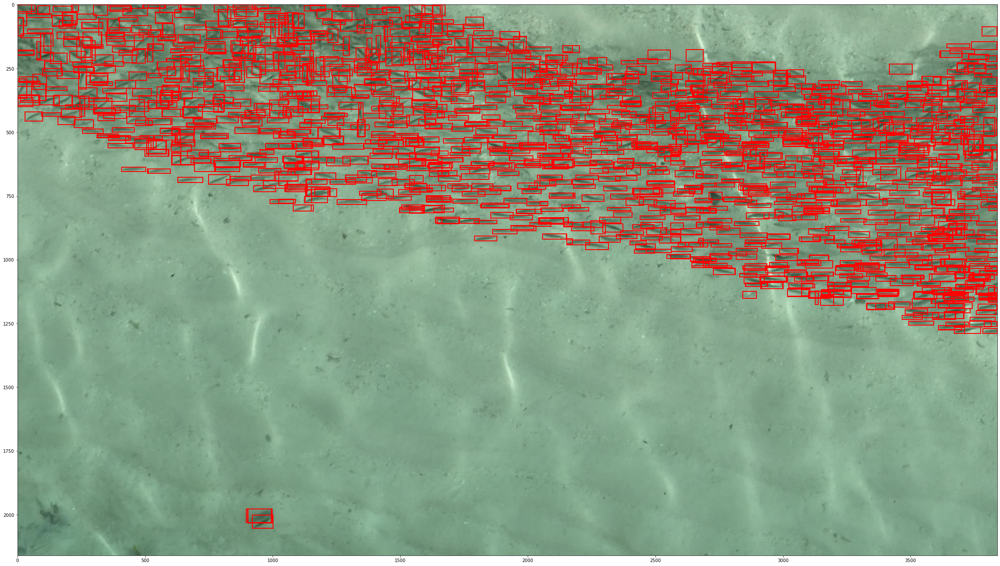

In [3]:
import cv2
import json
from ultralytics import YOLO  # Adjust the import according to how you import your model
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Load your YOLOv8 model
model = YOLO('/Users/apaula/Downloads/fishschool_0102.pt')

def tile_image(image, tile_size=640, overlap=0.2):
    """
    Tile the image into smaller overlapping tiles.
    Returns a list of tiles and their positions in the original image.
    """
    tiles = []
    step = int(tile_size * (1 - overlap))

    # Determine the starting point for the last tile in both dimensions
    max_y = image.shape[0] - tile_size
    max_x = image.shape[1] - tile_size

    for y in range(0, image.shape[0], step):
        for x in range(0, image.shape[1], step):
            # Adjust the tile size if we are at the edge of the image
            adjusted_tile_size_y = min(tile_size, image.shape[0] - y)
            adjusted_tile_size_x = min(tile_size, image.shape[1] - x)

            tile = image[y:y + adjusted_tile_size_y, x:x + adjusted_tile_size_x]
            tiles.append((tile, (x, y)))

    return tiles


def detect_objects_on_tiles(tiles, model):
    all_boxes = []
    for tile, position in tiles:
        # Save the tile temporarily (required for your model's input format)
        temp_tile_path = 'temp_tile.jpg'
        cv2.imwrite(temp_tile_path, tile)

        # Run detection on the tile
        results = model(temp_tile_path)
        json_results = json.loads(results[0].tojson())

        # Adjust box coordinates based on the tile position
        for detection in json_results:
            box = detection['box']
            x1, y1, x2, y2 = int(box['x1']), int(box['y1']), int(box['x2']), int(box['y2'])
            all_boxes.append((x1 + position[0], y1 + position[1], x2 + position[0], y2 + position[1]))

        # Cleanup: Delete the temporary tile file
        import os
        os.remove(temp_tile_path)
    
    return all_boxes

def draw_boxes_on_frame(frame, boxes):
    fig, ax = plt.subplots(1, figsize=(40, 30))
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))  # Convert frame to RGB for Matplotlib

    for box in boxes:
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

# Path to your whole picture
image_path = '/Users/apaula/Downloads/testframe.jpg'
frame = cv2.imread(image_path)

# Tile the image and detect objects
tiles = tile_image(frame)
boxes = detect_objects_on_tiles(tiles, model)

# Draw boxes on the whole frame
draw_boxes_on_frame(frame, boxes)



image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 13 easts, 5 norths, 4 northeasts, 7 northwests, 5 souths, 9 southeasts, 18 southwests, 101 wests, 181.7ms
Speed: 1.4ms preprocess, 181.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 11 easts, 1 north, 3 northeasts, 8 northwests, 7 souths, 9 southeasts, 16 southwests, 139 wests, 169.6ms
Speed: 1.0ms preprocess, 169.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 16 easts, 5 norths, 2 northeasts, 5 northwests, 12 souths, 15 southeasts, 15 southwests, 146 wests, 168.3ms
Speed: 0.9ms preprocess, 168.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/apaula/src/SharkVideoAnalysis/utils/temp_tile.jpg: 640x640 12 easts, 1 northeast, 6 northwests, 2 souths, 12 southeasts, 7 southwests, 154

/var/folders/fp/69w3242x183607ffnzm682500000gp/T/ipykernel_20438/3853721250.py:77: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = plt.subplot(122, polar=True)


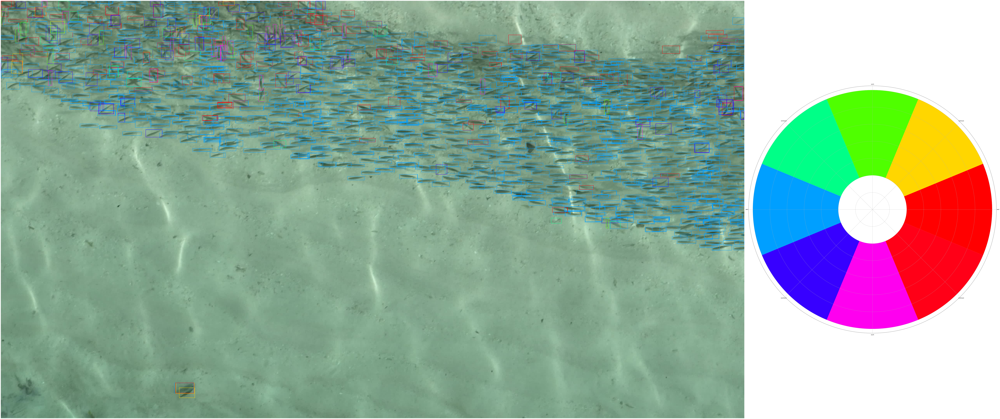

In [4]:
import cv2
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO  # Adjust the import according to your model setup

# Load your YOLOv8 model
model = YOLO('/Users/apaula/Downloads/fishschool_0102.pt')

def tile_image(image, tile_size=640, overlap=0.2):
    """
    Tile the image into smaller overlapping tiles.
    Returns a list of tiles and their positions in the original image.
    """
    tiles = []
    step = int(tile_size * (1 - overlap))

    # Determine the starting point for the last tile in both dimensions
    max_y = image.shape[0] - tile_size
    max_x = image.shape[1] - tile_size

    for y in range(0, image.shape[0], step):
        for x in range(0, image.shape[1], step):
            # Adjust the tile size if we are at the edge of the image
            adjusted_tile_size_y = min(tile_size, image.shape[0] - y)
            adjusted_tile_size_x = min(tile_size, image.shape[1] - x)

            tile = image[y:y + adjusted_tile_size_y, x:x + adjusted_tile_size_x]
            tiles.append((tile, (x, y)))

    return tiles

def detect_objects_on_tiles(tiles, model):
    all_boxes = []
    all_classes = []
    for tile, position in tiles:
        # Save the tile temporarily (required for your model's input format)
        temp_tile_path = 'temp_tile.jpg'
        cv2.imwrite(temp_tile_path, tile)

        # Run detection on the tile
        results = model(temp_tile_path)
        json_results = json.loads(results[0].tojson())

        # Adjust box coordinates and extract class information based on the tile position
        for detection in json_results:
            box = detection['box']
            x1, y1, x2, y2 = int(box['x1']), int(box['y1']), int(box['x2']), int(box['y2'])
            all_boxes.append((x1 + position[0], y1 + position[1], x2 + position[0], y2 + position[1]))
            all_classes.append(detection['class'])  # Assuming 'class' is the key for class information

        # Cleanup: Delete the temporary tile file
        import os
        os.remove(temp_tile_path)
    
    return all_boxes, all_classes

def draw_boxes_on_frame_with_color_wheel(frame, boxes, classes, class_labels, colors):
    # Create a subplot layout
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(120, 60), gridspec_kw={'width_ratios': [3, 1]})

    # Plot the frame with bounding boxes
    ax1.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))  # Convert frame to RGB for Matplotlib
    for box, cls in zip(boxes, classes):
        x1, y1, x2, y2 = box
        color = colors[cls % len(colors)]
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor=color, facecolor='none')
        ax1.add_patch(rect)
    ax1.axis('off')

    # Create the color wheel in the second subplot
    num_classes = len(class_labels)
    label_to_angle = {'east': 0, 'northeast': np.pi/4, 'north': np.pi/2, 'northwest': 3*np.pi/4,
                      'west': np.pi, 'southwest': 5*np.pi/4, 'south': 3*np.pi/2, 'southeast': 7*np.pi/4}
    angles = [label_to_angle[label] for label in class_labels]
    ax2 = plt.subplot(122, polar=True)
    ax2.set_theta_zero_location('E')
    ax2.set_theta_direction(1)
    ax2.set_xticks(angles)
    ax2.set_xticklabels(class_labels)
    ax2.set_yticklabels([])
    for ang, color in zip(angles, colors):
        ax2.bar(ang, 1, width=2*np.pi/num_classes, color=color, bottom=0.4)

    plt.tight_layout()
    plt.show()

# Path to your whole picture
image_path = '/Users/apaula/Downloads/testframe.jpg'
frame = cv2.imread(image_path)

# Tile the image and detect objects
tiles = tile_image(frame)
boxes, classes = detect_objects_on_tiles(tiles, model)

# Class labels and their corresponding colors
class_labels = ['east', 'north', 'northeast', 'northwest', 'south', 'southeast', 'southwest', 'west']
colors = [
    (1.0, 0.0, 0.0),       # East - Red
    (0.31, 1.0, 0.0),      # North - Bright Green
    (1.0, 0.84, 0.0),      # Northeast - Gold
    (0.0, 1.0, 0.529),     # Northwest - Turquoise
    (0.996, 0.0, 0.937),   # South - Pink
    (1.0, 0.0, 0.09),      # Southeast - Scarlet
    (0.216, 0.0, 1.0),     # Southwest - Electric Blue
    (0.0, 0.624, 1.0)      # West - Sky Blue
]

# Draw colored boxes on the whole frame and the color wheel
draw_boxes_on_frame_with_color_wheel(frame, boxes, classes, class_labels, colors)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def draw_color_wheel(class_labels, colors):
    num_classes = len(class_labels)

    # Map each class to an angle on the wheel: North (0°), East (90°), South (180°), West (270°)
    label_to_angle = {
        'North': 0,
        'Northeast': np.pi/4,
        'East': np.pi/2,
        'Southeast': 3*np.pi/4,
        'South': np.pi,
        'Southwest': 5*np.pi/4,
        'West': 3*np.pi/2,
        'Northwest': 7*np.pi/4
    }

    angles = [label_to_angle[label] for label in class_labels]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)  # Clockwise
    ax.set_xticks(angles)
    ax.set_xticklabels(class_labels)
    ax.set_yticklabels([])

    for ang, color in zip(angles, colors):
        ax.bar(ang, 1, width=2*np.pi/num_classes, color=color, bottom=0.4)

    plt.show()

# Example usage
class_labels = ['North', 'Northeast', 'East', 'Southeast', 'South', 'Southwest', 'West', 'Northwest']
colors = [(0.31, 1.0, 0.0), (1.0, 0.84, 0.0), (1.0, 0.0, 0.0), (1.0, 0.0, 0.09), (0.996, 0.0, 0.937), (0.216, 0.0, 1.0), (0.0, 0.624, 1.0), (0.0, 1.0, 0.529)]

draw_color_wheel(class_labels, colors)
